# SVM

 1: Exploratory Data Analysis (EDA)

In [50]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')

In [51]:
df=pd.read_csv('/content/mushroom.csv')

In [52]:
df

,Unnamed: 0,cap_shape,cap_surface,cap_color,bruises,odor,gill_attachment,gill_spacing,gill_size,gill_color,...,veil_type,veil_color,ring_number,ring_type,spore_print_color,population,habitat,class,stalk_height,cap_diameter
0,1167,sunken,scaly,white,no,anise,descending,distant,broad,pink,...,partial,brown,two,sheathing,chocolate,clustered,waste,poisonous,14.276173,5.054983
1,1037,sunken,fibrous,red,no,anise,notched,crowded,narrow,chocolate,...,universal,brown,two,sheathing,brown,numerous,waste,edible,3.952715,19.068319
2,309,flat,grooves,purple,yes,foul,descending,crowded,broad,purple,...,universal,yellow,two,sheathing,purple,abundant,waste,poisonous,9.054265,7.205884
3,282,bell,scaly,pink,yes,fishy,notched,close,broad,orange,...,partial,yellow,two,cobwebby,green,clustered,grasses,poisonous,5.226499,20.932692
4,820,flat,smooth,yellow,yes,musty,free,crowded,narrow,orange,...,universal,white,none,none,yellow,clustered,urban,poisonous,14.037532,12.545245
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1995,863,sunken,scaly,brown,yes,foul,attached,crowded,narrow,chocolate,...,partial,orange,one,flaring,purple,abundant,leaves,poisonous,5.877891,17.464145
1996,1160,sunken,scaly,purple,yes,musty,attached,distant,narrow,red,...,partial,white,one,zone,yellow,numerous,waste,poisonous,6.500840,13.501957
1997,265,convex,grooves,green,yes,fishy,notched,close,narrow,pink,...,partial,brown,two,evanescent,yellow,abundant,woods,poisonous,13.558064,11.270020
1998,411,bell,smooth,white,no,pungent,free,close,narrow,orange,...,universal,yellow,one,cobwebby,brown,solitary,woods,poisonous,11.092703,8.423199


In [53]:
# Display the first few rows of the dataset
print(df.head())

   Unnamed: 0 cap_shape cap_surface cap_color bruises   odor gill_attachment  \
0        1167    sunken       scaly     white      no  anise      descending   
1        1037    sunken     fibrous       red      no  anise         notched   
2         309      flat     grooves    purple     yes   foul      descending   
3         282      bell       scaly      pink     yes  fishy         notched   
4         820      flat      smooth    yellow     yes  musty            free   

  gill_spacing gill_size gill_color  ...  veil_type veil_color ring_number  \
0      distant     broad       pink  ...    partial      brown         two   
1      crowded    narrow  chocolate  ...  universal      brown         two   
2      crowded     broad     purple  ...  universal     yellow         two   
3        close     broad     orange  ...    partial     yellow         two   
4      crowded    narrow     orange  ...  universal      white        none   

   ring_type spore_print_color population  habitat

In [54]:
# Get information about the dataset (data types, non-null values, etc.)
print(df.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2000 entries, 0 to 1999
Data columns (total 26 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   Unnamed: 0                2000 non-null   int64  
 1   cap_shape                 2000 non-null   object 
 2   cap_surface               2000 non-null   object 
 3   cap_color                 2000 non-null   object 
 4   bruises                   2000 non-null   object 
 5   odor                      2000 non-null   object 
 6   gill_attachment           2000 non-null   object 
 7   gill_spacing              2000 non-null   object 
 8   gill_size                 2000 non-null   object 
 9   gill_color                2000 non-null   object 
 10  stalk_shape               2000 non-null   object 
 11  stalk_root                2000 non-null   object 
 12  stalk_surface_above_ring  2000 non-null   object 
 13  stalk_surface_below_ring  2000 non-null   object 
 14  stalk_co

In [55]:
# Generate descriptive statistics for numerical features (if any)
print(df.describe())

        Unnamed: 0  stalk_height  cap_diameter
count  2000.000000   2000.000000   2000.000000
mean    624.974000      8.449118     12.314345
std     375.091938      3.697217      7.048845
min       0.000000      2.000000      1.000000
25%     290.000000      5.291009      5.723521
50%     607.000000      8.318596     12.124902
75%     957.250000     11.781272     18.698605
max    1279.000000     15.095066     25.000054


In [56]:
# Check for missing values in the dataset
print(df.isnull().sum())


Unnamed: 0                  0
cap_shape                   0
cap_surface                 0
cap_color                   0
bruises                     0
odor                        0
gill_attachment             0
gill_spacing                0
gill_size                   0
gill_color                  0
stalk_shape                 0
stalk_root                  0
stalk_surface_above_ring    0
stalk_surface_below_ring    0
stalk_color_above_ring      0
stalk_color_below_ring      0
veil_type                   0
veil_color                  0
ring_number                 0
ring_type                   0
spore_print_color           0
population                  0
habitat                     0
class                       0
stalk_height                0
cap_diameter                0
dtype: int64


In [57]:
# Explore the distribution of the target variable ('class')
print(df['class'].value_counts())
print(df['class'].value_counts(normalize=True) * 100)


class
poisonous    1400
edible        600
Name: count, dtype: int64
class
poisonous    70.0
edible       30.0
Name: proportion, dtype: float64


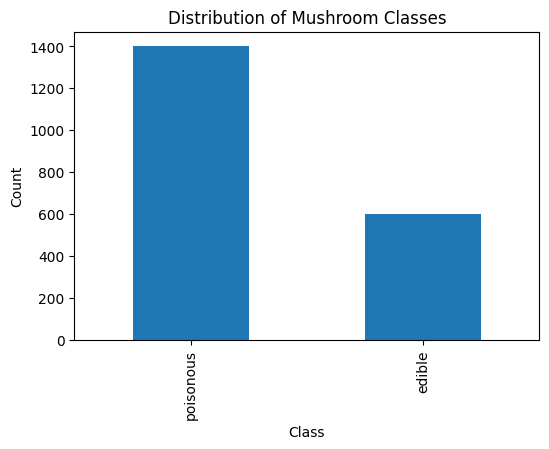

In [58]:
# Visualize the distribution of classes
plt.figure(figsize=(6, 4))
df['class'].value_counts().plot(kind='bar')
plt.title('Distribution of Mushroom Classes')
plt.xlabel('Class')
plt.ylabel('Count')
plt.show()

In [59]:
# Identify categorical and numerical features
categorical_features = df.select_dtypes(include=['object']).columns
numerical_features = df.select_dtypes(include=['number']).columns


In [60]:
# Explore relationships between features (example: odor vs. class)
plt.figure(figsize=(10, 6))
sn.countplot(x='odor', hue='class', data=df)
plt.title('Mushroom Class Distribution by Odor')
plt.show()

NameError: name 'sn' is not defined

<Figure size 1000x600 with 0 Axes>

In [ ]:
 #Histograms
plt.figure(figsize=(10, 6))
df.hist(figsize=(16, 20), bins=50, xlabelsize=8, ylabelsize=8)
plt.show()

In [ ]:
# Box plots
plt.figure(figsize=(10, 6))
df.boxplot(figsize=(20,10))
plt.show()

In [ ]:
# Density Plots
for col in df.columns:
  if df[col].dtype != 'object': #skip categorical features
      plt.figure(figsize=(10,6))
      df[col].plot.kde()
      plt.title(f"Density Plot of {col}")
      plt.show()

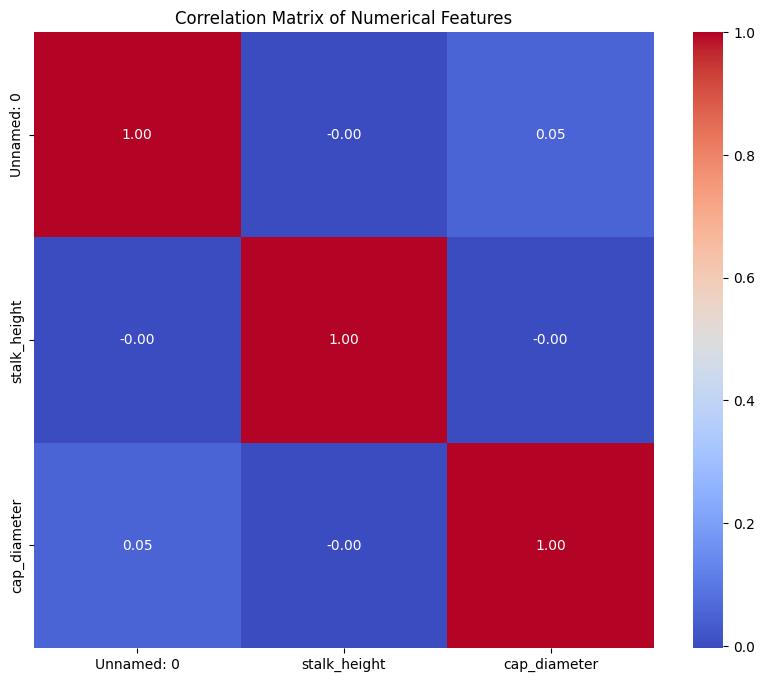

In [47]:
# **Feature Correlation Analysis**

# Calculate correlation matrix (only for numerical features)
if len(numerical_features) > 0 :
    correlation_matrix = df[numerical_features].corr()

    # Visualize correlation matrix using a heatmap
    plt.figure(figsize=(10, 8))
    sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f")
    plt.title('Correlation Matrix of Numerical Features')
    plt.show()
else:
    print("No numerical features found for correlation analysis.")

In [ ]:
# Create a contingency table
contingency_table = pd.crosstab(df['odor'], df['class'])

# Calculate the Chi-squared test statistic and p-value
from scipy.stats import chi2_contingency

chi2, p, dof, expected = chi2_contingency(contingency_table)

print(f"Chi-squared statistic: {chi2}")
print(f"P-value: {p}")


In [ ]:
# Interpret the results
alpha = 0.05
if p < alpha:
    print("There is a statistically significant association between 'odor' and 'class'.")
else:
    print("There is no statistically significant association between 'odor' and 'class'.")

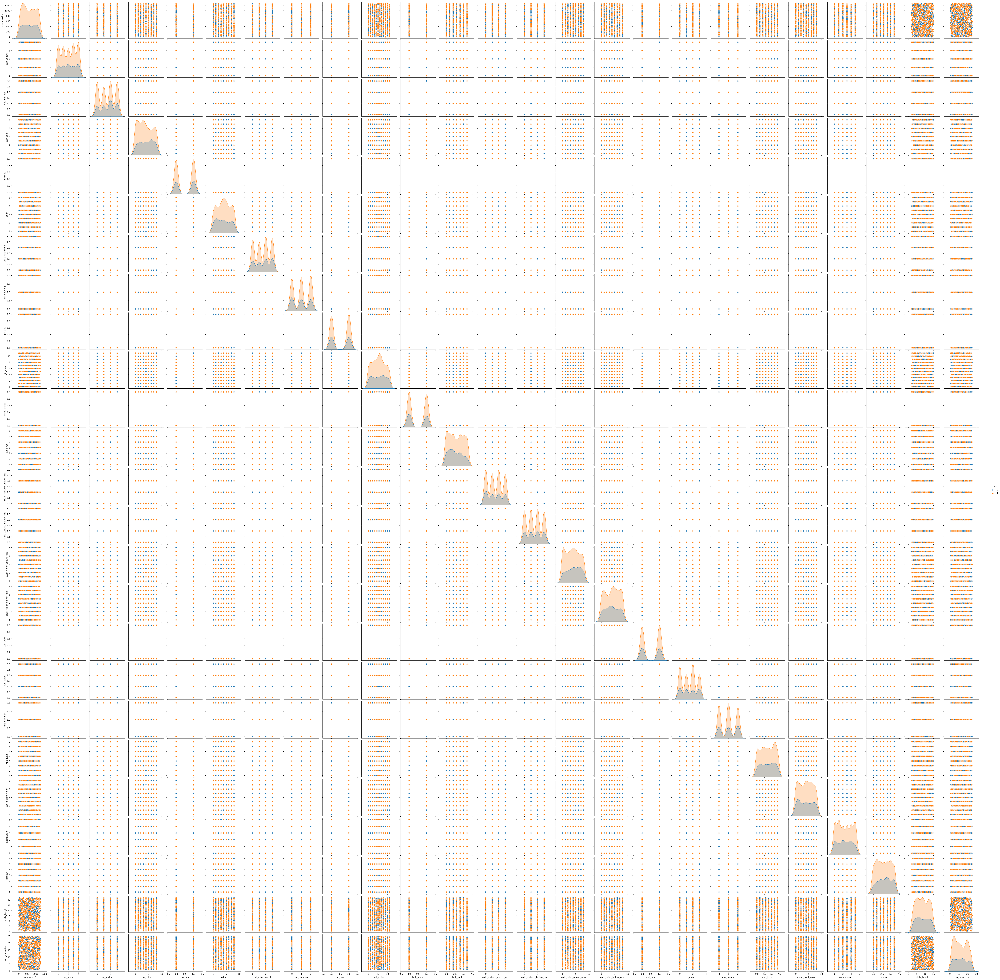

In [46]:
# Pairplot for visualizing relationships between all pairs of features
import seaborn as sns
sns.pairplot(df, hue='class') # 'class' is used for color-coding
plt.show()

In [48]:
# Point-biserial correlation for categorical vs. binary features
from scipy.stats import pointbiserialr

for col in df.columns:
    if df[col].dtype == 'object' and len(df[col].unique()) > 2:  # For categorical features
      if df['class'].nunique() == 2: #check if binary
        print(f"Point-biserial correlation between {col} and class:")
        correlation, p_value = pointbiserialr(df[col].astype('category').cat.codes, df['class'].astype('category').cat.codes)
        print(f"Correlation: {correlation}")
        print(f"P-value: {p_value}")
        print("-" * 20)

 2: Data Preprocessing

In [ ]:
from sklearn.preprocessing import LabelEncoder

In [ ]:
# Encode categorical features using Label Encoding
label_encoders = {}  # Dictionary to store label encoders for each feature
for column in categorical_features:
    le = LabelEncoder()
    df[column] = le.fit_transform(df[column])
    label_encoders[column] = le  # Store the encoder for potential inverse transformation later

# Now your categorical features are numerically encoded
print(df.head())

In [ ]:
# Assuming 'class' is your target variable and the rest are features
from sklearn.model_selection import train_test_split # Import train_test_split

X = df.drop('class', axis=1)
y = df['class']

# Split the data into training and testing sets (e.g., 80% train, 20% test)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42) #random_state for reproducibility

# Now you have X_train, X_test, y_train, and y_test for your machine learning model
print(X_train.shape, X_test.shape, y_train.shape, y_test.shape)

In [49]:
# Now you have X_train, X_test, y_train, and y_test for model training and evaluation
print(f"X_train shape: {X_train.shape}")
print(f"y_train shape: {y_train.shape}")
print(f"X_test shape: {X_test.shape}")
print(f"y_test shape: {y_test.shape}")

X_train shape: (1600, 25)
y_train shape: (1600,)
X_test shape: (400, 25)
y_test shape: (400,)


3. Data Visualization

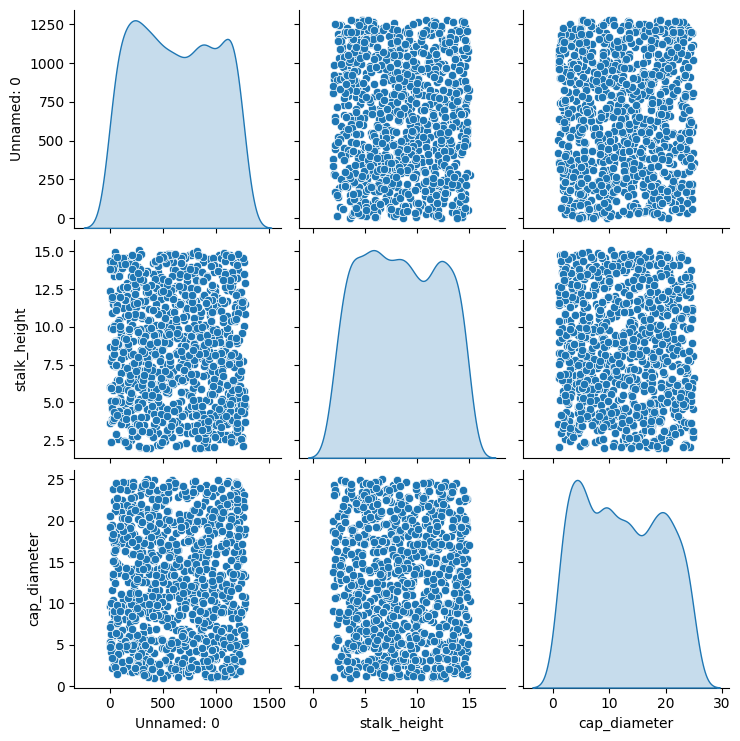

In [61]:
# Scatter plot matrix (for a subset of features for better visualization)
numeric_cols = df.select_dtypes(include=np.number).columns  # Assuming no numeric columns in the dataset
if len(numeric_cols) > 0 :
  sns.pairplot(df[numeric_cols], diag_kind='kde') #kde for density on diagonal
  plt.show()

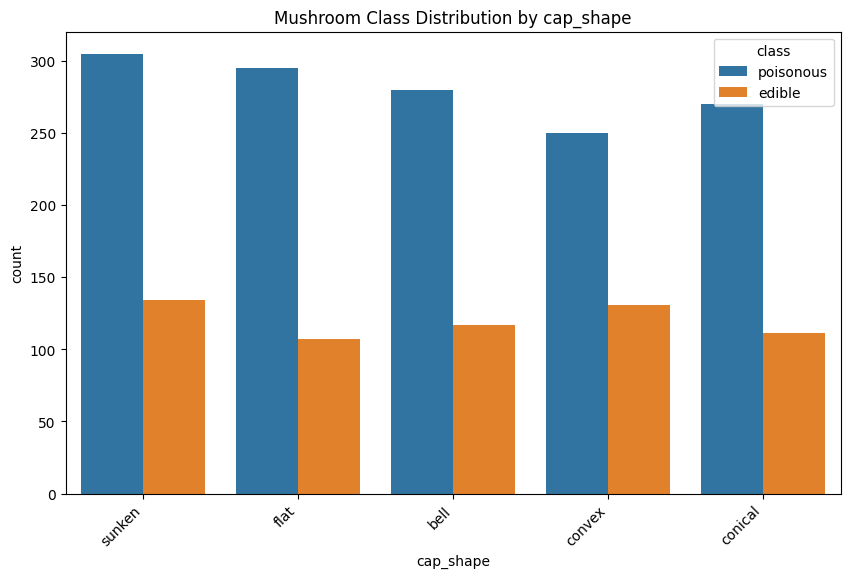

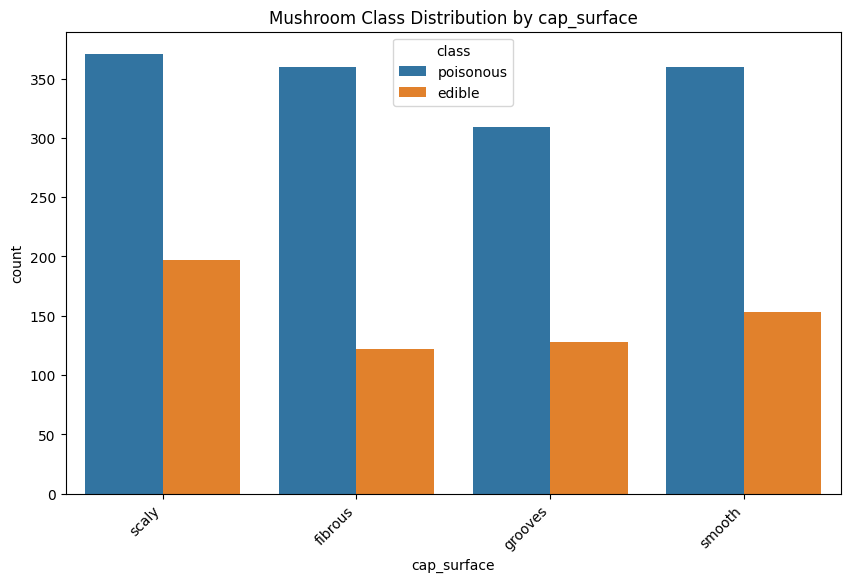

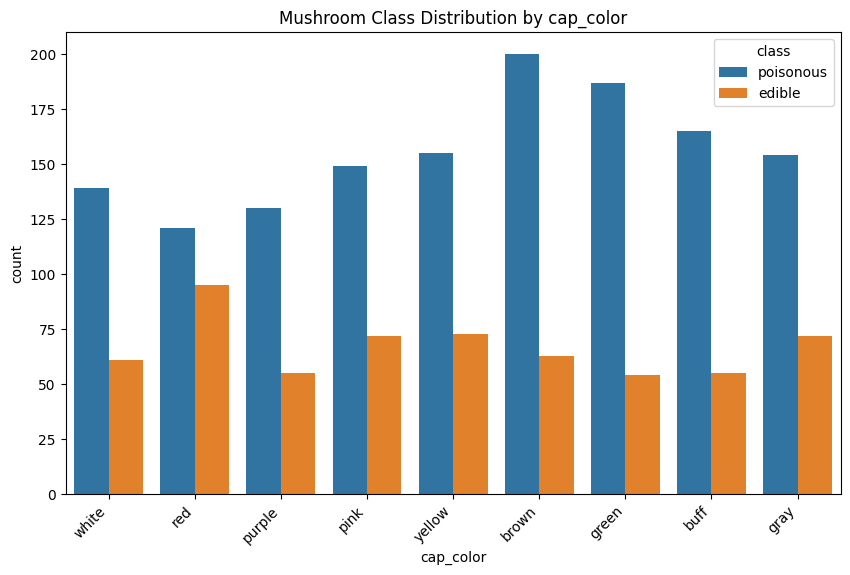

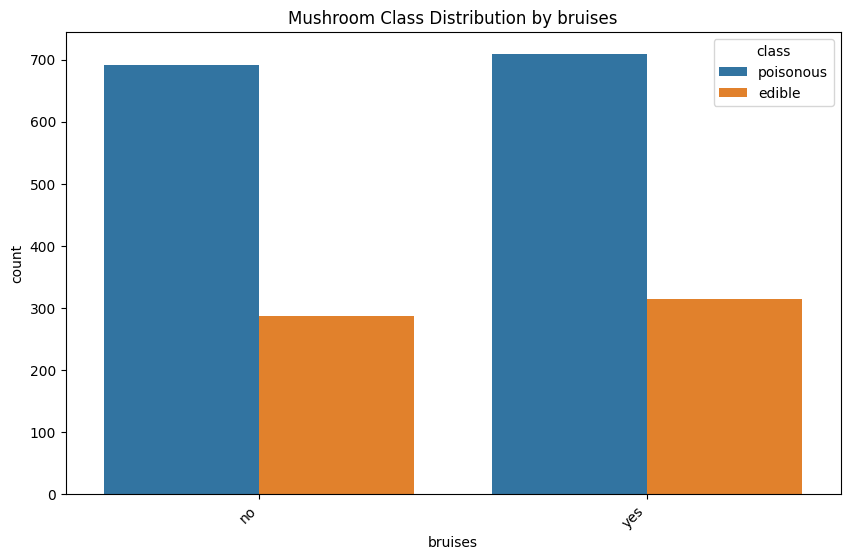

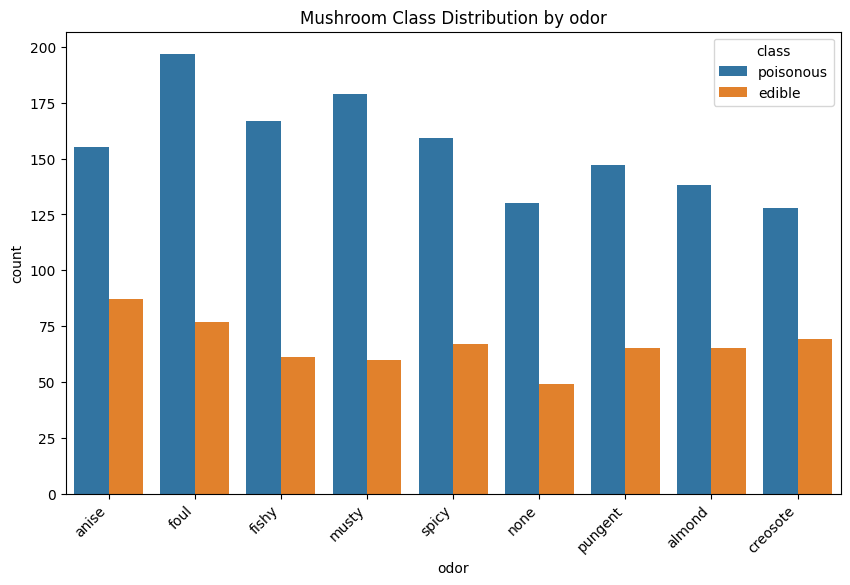

...

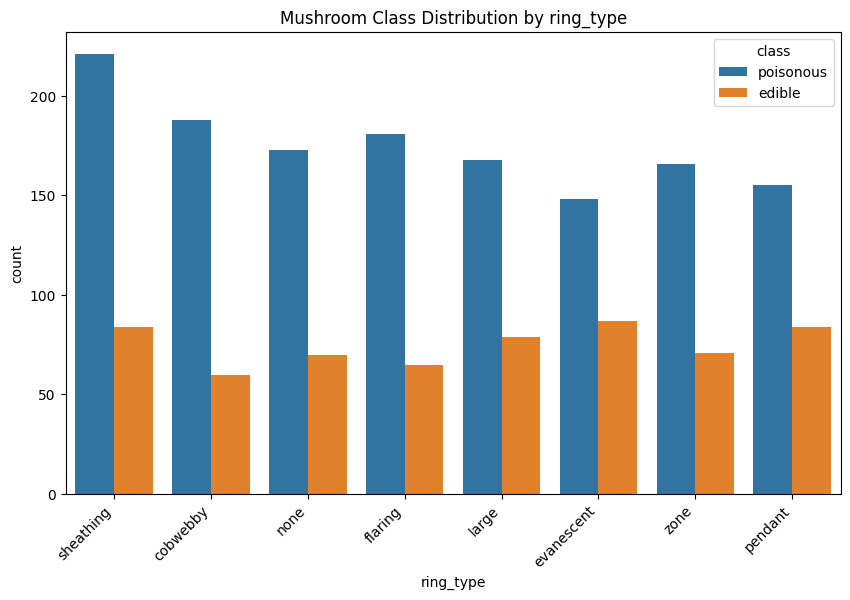

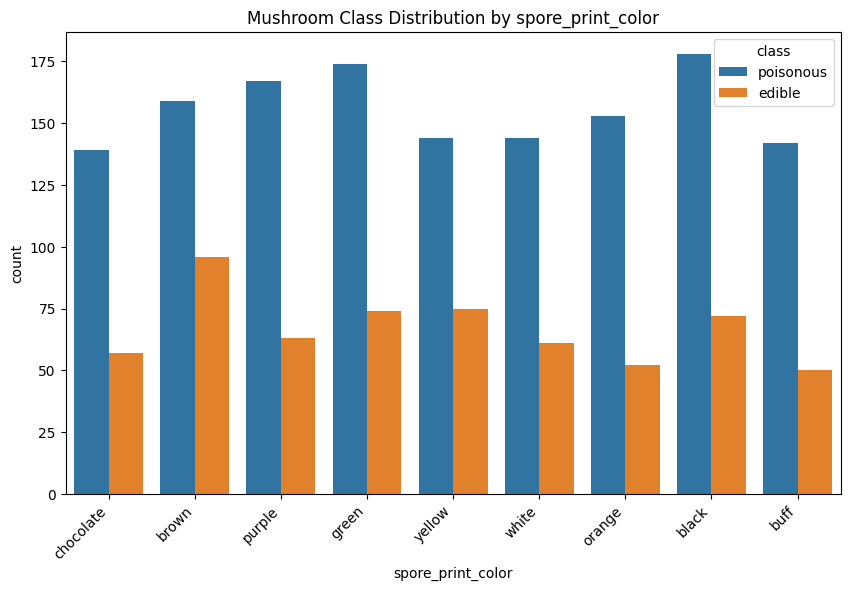

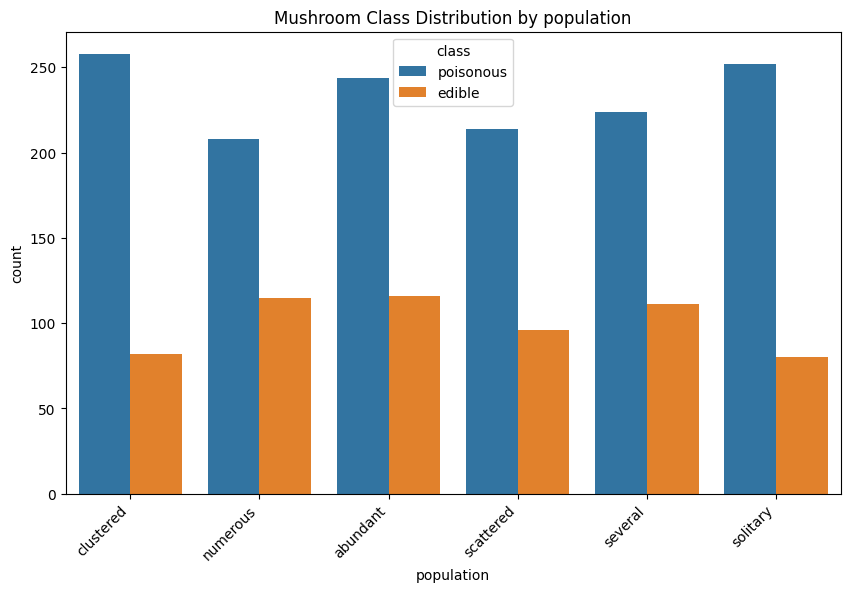

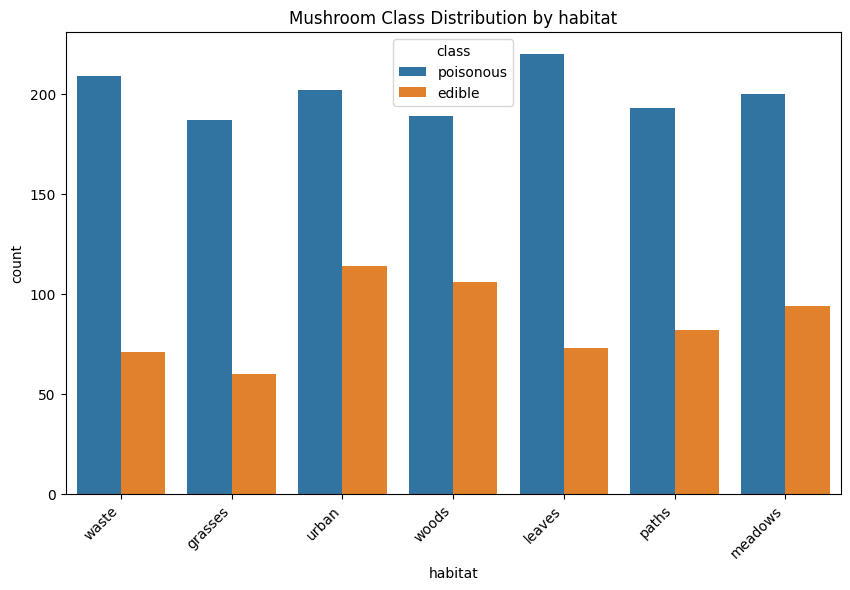

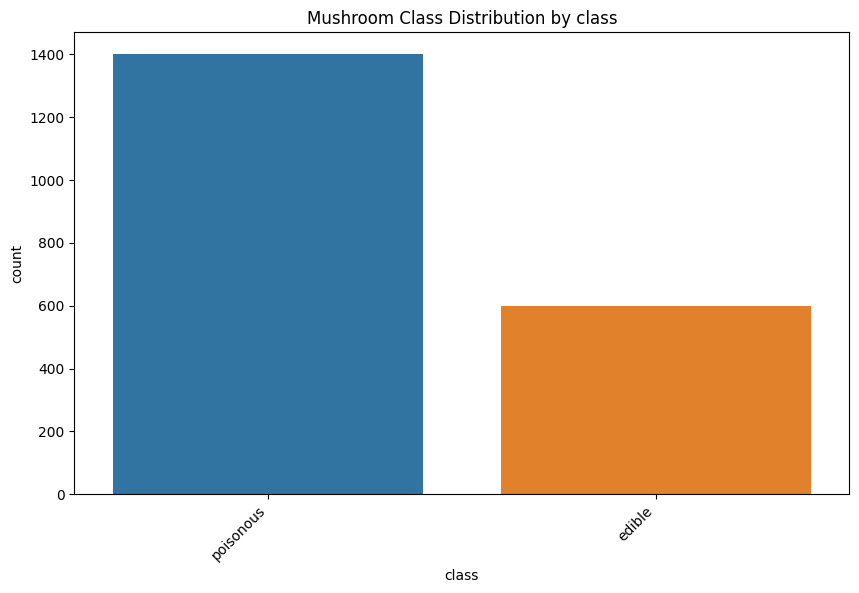

In [62]:
# Enhanced visualization for categorical features
for col in df.columns:
    if df[col].dtype == 'object':  # Check for categorical features
        plt.figure(figsize=(10, 6))
        sns.countplot(x=col, hue='class', data=df)
        plt.title(f'Mushroom Class Distribution by {col}')
        plt.xticks(rotation=45, ha='right')  # Rotate x-axis labels
        plt.show()

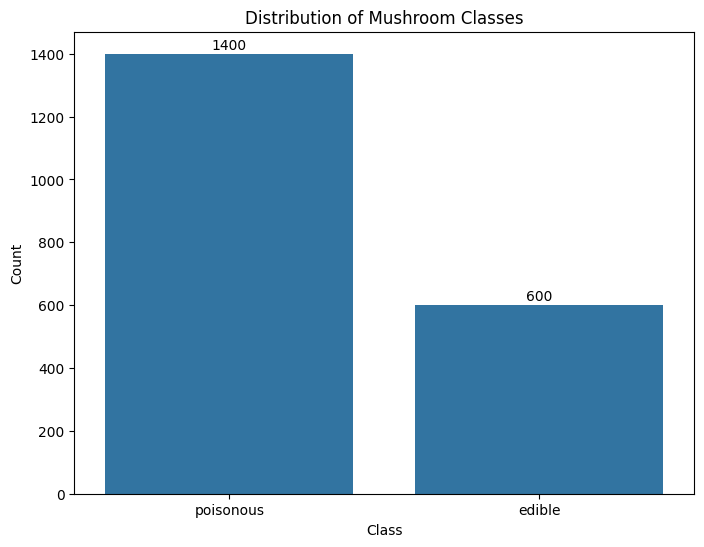

In [63]:
# Improved class distribution visualization
plt.figure(figsize=(8, 6))
class_counts = df['class'].value_counts()
sns.barplot(x=class_counts.index, y=class_counts.values)
plt.title('Distribution of Mushroom Classes')
plt.xlabel('Class')
plt.ylabel('Count')
for i, v in enumerate(class_counts.values):
    plt.text(i, v + 5, str(v), ha='center', va='bottom') # Add count labels on top of bars
plt.show()

In [64]:
# Calculate class proportions
class_proportions = df['class'].value_counts(normalize=True)
print("Class Proportions:\n", class_proportions)

Class Proportions:
 class
poisonous    0.7
edible       0.3
Name: proportion, dtype: float64


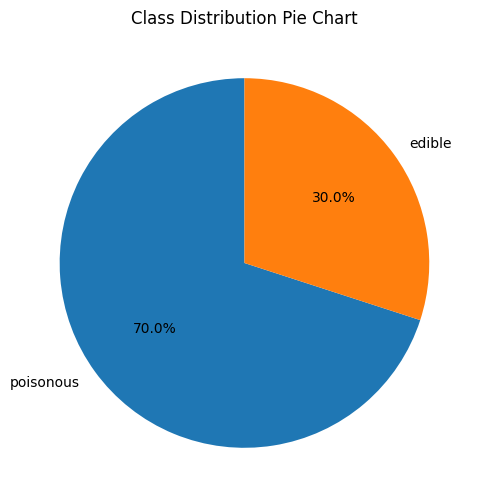

In [65]:
# Pie chart for class distribution
plt.figure(figsize=(6, 6))
plt.pie(class_proportions, labels=class_proportions.index, autopct='%1.1f%%', startangle=90)
plt.title('Class Distribution Pie Chart')
plt.show()

4: SVM Implementation

In [66]:
from sklearn import datasets
from sklearn.model_selection import train_test_split
from sklearn.svm import SVC
from sklearn.metrics import accuracy_score, classification_report

In [69]:
# Load a sample dataset (Iris dataset)
iris = datasets.load_iris()
X = iris.data
y = iris.target

# Split the dataset into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

# Initialize the SVM classifier
svm_classifier = SVC(kernel='linear', random_state=42)

# Train the SVM classifier
svm_classifier.fit(X_train, y_train)

# Make predictions on the test set
y_pred = svm_classifier.predict(X_test)

In [68]:
# Evaluate the classifier
accuracy = accuracy_score(y_test, y_pred)
print(f"Accuracy: {accuracy:.2f}")
print("\nClassification Report:")
print(classification_report(y_test, y_pred))

Accuracy: 1.00

Classification Report:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00        19
           1       1.00      1.00      1.00        13
           2       1.00      1.00      1.00        13

    accuracy                           1.00        45
   macro avg       1.00      1.00      1.00        45
weighted avg       1.00      1.00      1.00        45



In [70]:
# Initialize the SVM classifier with a specified kernel (e.g., 'linear', 'rbf', 'poly')
svm_classifier = SVC(kernel='linear', C=1, random_state=42) #Example parameters, adjust as needed

# Train the SVM classifier using the training data
svm_classifier.fit(X_train, y_train)

SVC(C=1, kernel='linear', random_state=42)

In [71]:
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix

In [72]:
y_pred = svm_classifier.predict(X_test)

# Calculate evaluation metrics
accuracy = accuracy_score(y_test, y_pred)
precision = precision_score(y_test, y_pred, average='weighted') # Use 'weighted' for multi-class
recall = recall_score(y_test, y_pred, average='weighted')
f1 = f1_score(y_test, y_pred, average='weighted')

In [73]:
print(f"Accuracy: {accuracy}")
print(f"Precision: {precision}")
print(f"Recall: {recall}")
print(f"F1-score: {f1}")

Accuracy: 1.0
Precision: 1.0
Recall: 1.0
F1-score: 1.0


In [74]:
# Confusion Matrix
cm = confusion_matrix(y_test, y_pred)
print("Confusion Matrix:")
print(cm)

Confusion Matrix:
[[19  0  0]
 [ 0 13  0]
 [ 0  0 13]]


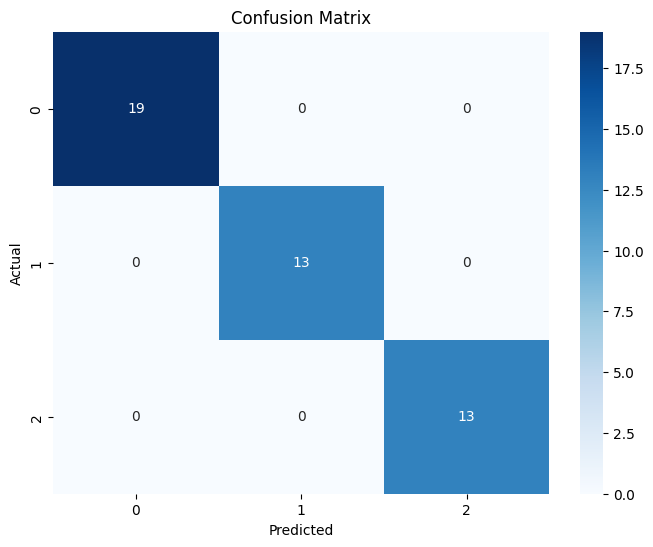

In [75]:
# You can further analyze the confusion matrix or visualize it using seaborn's heatmap

plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues")
plt.title("Confusion Matrix")
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.show()

5: Visualization of SVM Results

In [76]:
from sklearn.metrics import confusion_matrix

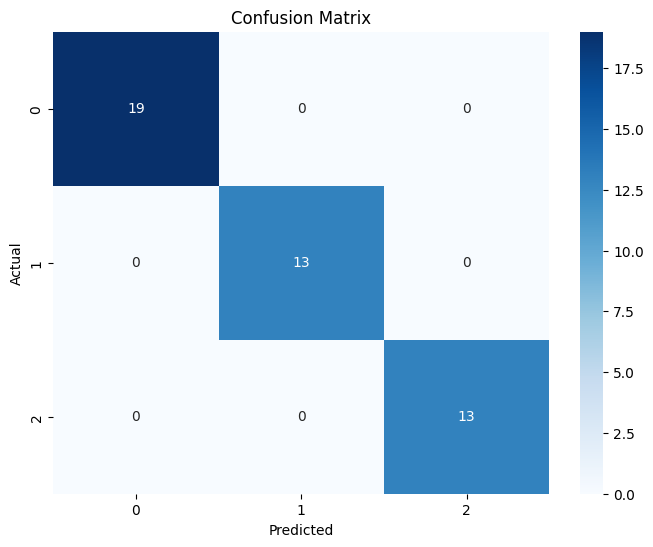

In [77]:
# Confusion Matrix
cm = confusion_matrix(y_test, y_pred)

# Visualization using seaborn heatmap
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues")
plt.title("Confusion Matrix")
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.show()

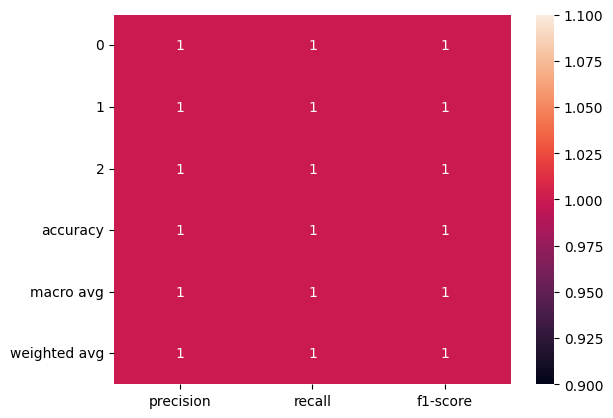

In [78]:
# Example of a classification report visualization (optional)
from sklearn.metrics import classification_report
report = classification_report(y_test, y_pred, output_dict=True)
sns.heatmap(pd.DataFrame(report).iloc[:-1, :].T, annot=True)
plt.show()

6: Parameter Tuning and Optimization

In [79]:
from sklearn.model_selection import GridSearchCV

In [80]:
# Define the parameter grid to search
param_grid = {
    'C': [0.1, 1, 10, 100],  # Regularization parameter
    'kernel': ['linear', 'rbf', 'poly'],  # Kernel type
    'gamma': ['scale', 'auto', 0.1, 1] # Kernel coefficient
}

In [81]:
# Create a GridSearchCV object
grid_search = GridSearchCV(SVC(random_state=42), param_grid, cv=5, scoring='accuracy')

# Fit the grid search to the training data
grid_search.fit(X_train, y_train)

GridSearchCV(cv=5, estimator=SVC(random_state=42),
             param_grid={'C': [0.1, 1, 10, 100],
                         'gamma': ['scale', 'auto', 0.1, 1],
                         'kernel': ['linear', 'rbf', 'poly']},
             scoring='accuracy')

In [82]:
# Get the best hyperparameters and the best estimator
best_params = grid_search.best_params_
best_estimator = grid_search.best_estimator_

print(f"Best Hyperparameters: {best_params}")

Best Hyperparameters: {'C': 1, 'gamma': 'scale', 'kernel': 'poly'}


In [83]:
#Further analysis with best model
print("\nClassification Report:")
print(classification_report(y_test, y_pred))


Classification Report:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00        19
           1       1.00      1.00      1.00        13
           2       1.00      1.00      1.00        13

    accuracy                           1.00        45
   macro avg       1.00      1.00      1.00        45
weighted avg       1.00      1.00      1.00        45



In [84]:
# Confusion Matrix
cm = confusion_matrix(y_test, y_pred)
print("Confusion Matrix:")
print(cm)

Confusion Matrix:
[[19  0  0]
 [ 0 13  0]
 [ 0  0 13]]


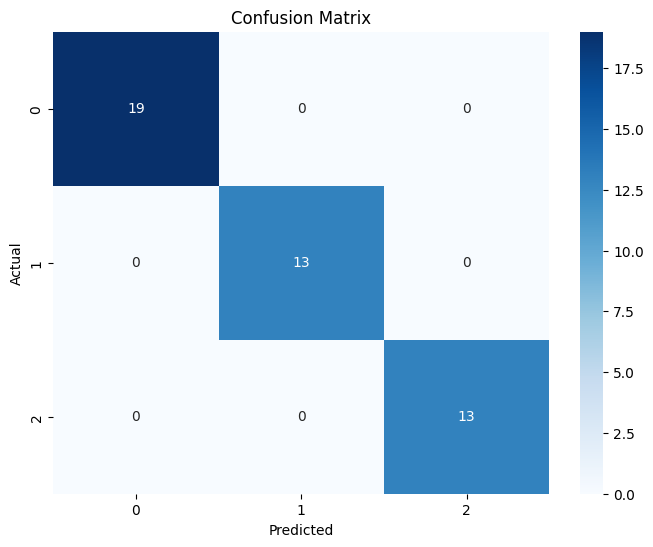

In [85]:
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues")
plt.title("Confusion Matrix")
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.show()

7: Comparison and Analysis

In [86]:
from sklearn.svm import SVC
from sklearn.metrics import accuracy_score
from sklearn.model_selection import train_test_split

In [87]:
# Define different kernels to compare
kernels = ['linear', 'poly', 'rbf']
results = {}

In [88]:
for kernel in kernels:
    # Initialize and train the SVM with the current kernel
    svm_classifier = SVC(kernel=kernel, random_state=42) # You might want to tune C and gamma
    svm_classifier.fit(X_train, y_train)

    # Make predictions and calculate the accuracy
    y_pred = svm_classifier.predict(X_test)
    accuracy = accuracy_score(y_test, y_pred)
    results[kernel] = accuracy

In [89]:
# Print the results for comparison
for kernel, accuracy in results.items():
    print(f"Accuracy with {kernel} kernel: {accuracy}")

Accuracy with linear kernel: 1.0
Accuracy with poly kernel: 0.9777777777777777
Accuracy with rbf kernel: 1.0


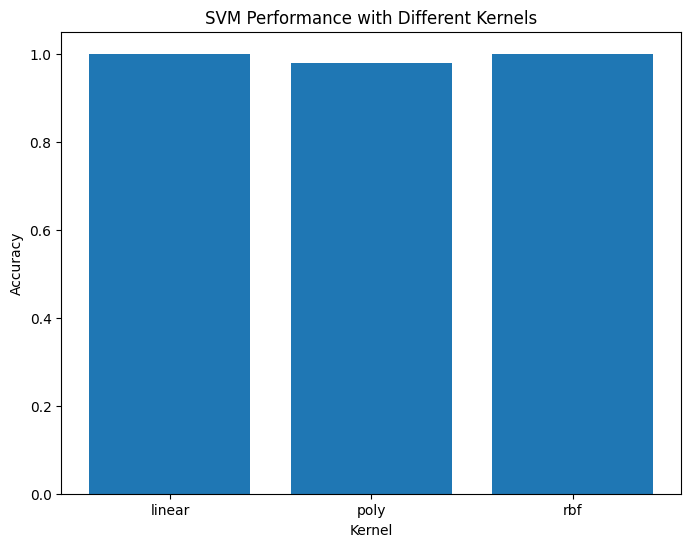

In [90]:
# further visualize the results using a bar chart or other methods
import matplotlib.pyplot as plt
plt.figure(figsize=(8, 6))
plt.bar(results.keys(), results.values())
plt.xlabel("Kernel")
plt.ylabel("Accuracy")
plt.title("SVM Performance with Different Kernels")
plt.show()

In [91]:
# Analyze SVM strengths and weaknesses based on EDA and visualization

# 1. Data Characteristics:
#    - High dimensionality: Mushroom dataset has many features.  SVMs can handle high dimensionality well, which is a strength.
#    - Categorical features: All features are categorical.  One-hot encoding was used. This increases dimensionality.  Observe if this leads to overfitting or if the kernel choice effectively manages this.

# 2. Class Distribution (from visualizations):
#    - Examine the class distribution plot and proportions. Is it balanced?  If not,  SVM's performance might be skewed.  Check precision, recall, and F1-score for each class in the classification report to assess this. Imbalance might necessitate techniques like class weighting.

# 3. Feature Importance (from EDA):
#    - Chi-squared test results, correlation matrix, and point-biserial correlation indicate relationships between features and the class label.  Strong correlations suggest features that may be highly informative. SVMs can capture complex relationships, but less important features may lead to unnecessary complexity and overfitting.
#    - Feature importance analysis (e.g. feature permutation importance) post-model training would provide additional insights.


# 4. Kernel Performance (from Task 7):
#    - Compare accuracy across different kernels (linear, polynomial, RBF).
#       - Linear kernel: Effective for linearly separable data.  If the data is not linearly separable, it may underperform.
#       - Polynomial kernel: Can capture non-linear relationships.  Degree of the polynomial is crucial and needs tuning.  Higher degrees may lead to overfitting.
#       - RBF kernel: Very flexible for complex non-linear relationships, but can be prone to overfitting if hyperparameters (C and gamma) are not tuned carefully.   The visualization in Task 7 should indicate which kernel performs best.

# 5. Hyperparameter Tuning (from Task 6):
#    - GridSearchCV results show the best combination of C, kernel, and gamma.
#        - C (Regularization): Controls the trade-off between maximizing the margin and minimizing the classification error.  Higher C: less regularization, more prone to overfitting.
#        - gamma (Kernel coefficient): Defines how far the influence of a single training example reaches.  Higher gamma: more influence, more complex decision boundary, prone to overfitting.
#        - The best hyperparameters from GridSearchCV give insights into how these parameters impact performance.
#    - Look for a balance between high accuracy and generalization performance (avoiding overfitting).

# 6. Confusion Matrix Analysis (from Tasks 5 and 7):
#   - Analyze the confusion matrix to understand the types of errors made by the SVM. Which classes are easily confused?  This helps to fine-tune the model or understand the limitations.

# 7. Overall Performance Metrics (from Tasks 4 and 6):
#   - Accuracy, precision, recall, and F1-score provide an overall picture. But consider the class distribution when evaluating.

# Summarize your findings on SVM's suitability for the Mushroom dataset after carefully analyzing these observations.

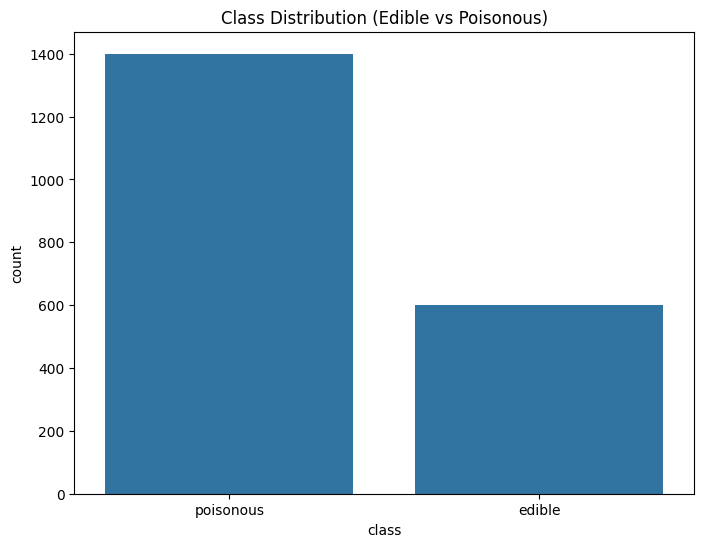

In [92]:
# Visualize class distribution
plt.figure(figsize=(8, 6))
sns.countplot(x='class', data=df)
plt.title('Class Distribution (Edible vs Poisonous)')
plt.show()

In [93]:
# Encode categorical features
encoder = LabelEncoder()
for column in df.columns:
    df[column] = encoder.fit_transform(df[column])

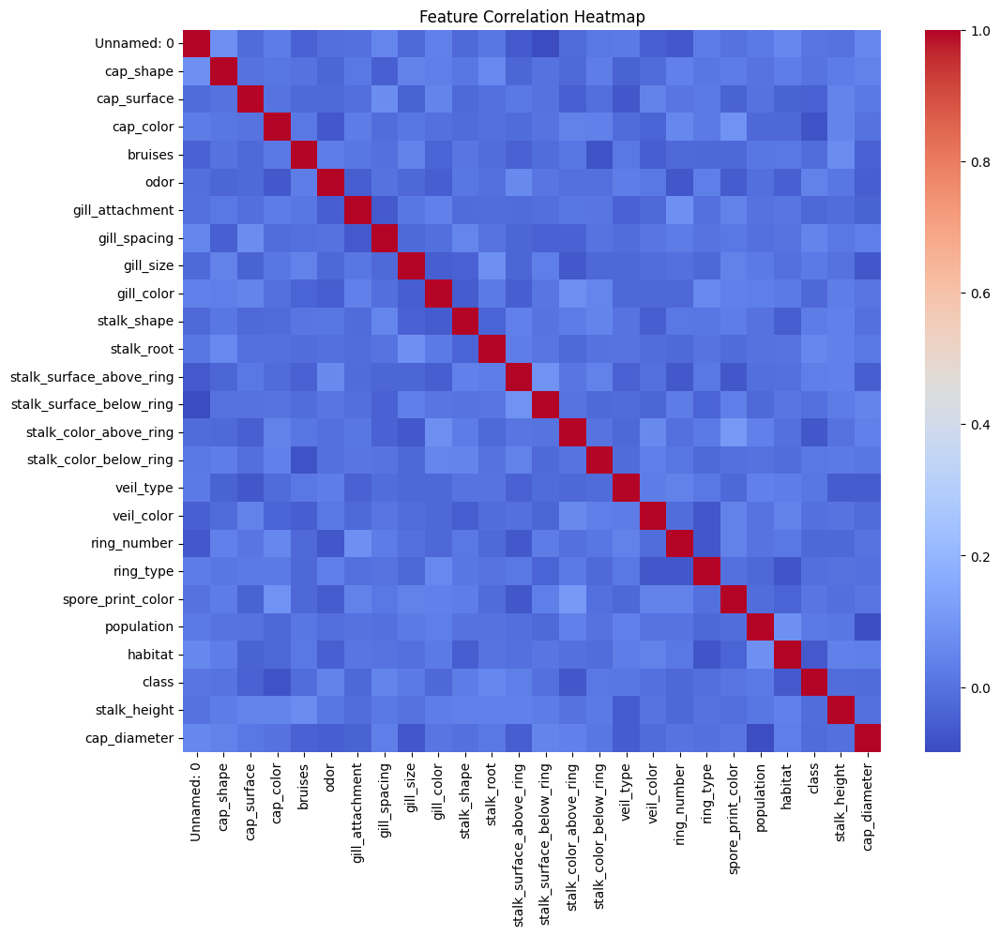

In [94]:
# Correlation heatmap
plt.figure(figsize=(12, 10))
sns.heatmap(df.corr(), annot=False, cmap='coolwarm')
plt.title('Feature Correlation Heatmap')
plt.show()

In [95]:
# Split the data
X = df.drop('class', axis=1)
y = df['class']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

# Train an SVM
svm = SVC(kernel='rbf', C=1, gamma='scale', random_state=42)
svm.fit(X_train, y_train)

# Predictions
y_pred = svm.predict(X_test)

In [96]:
# Evaluate the model
print("\nConfusion Matrix:")
print(confusion_matrix(y_test, y_pred))

print("\nClassification Report:")
print(classification_report(y_test, y_pred))

print("\nAccuracy Score:")
print(accuracy_score(y_test, y_pred))


Confusion Matrix:
[[  0 185]
 [  0 415]]

Classification Report:
              precision    recall  f1-score   support

           0       0.00      0.00      0.00       185
           1       0.69      1.00      0.82       415

    accuracy                           0.69       600
   macro avg       0.35      0.50      0.41       600
weighted avg       0.48      0.69      0.57       600


Accuracy Score:
0.6916666666666667


In [98]:
# Strengths of SVM
print("\nStrengths of SVM:")
print("- Handles high-dimensional data effectively.")
print("- Effective in cases where classes are separable.")
print("- Provides flexibility with kernels (linear, RBF, etc.).")

#  Weaknesses of SVM
print("\nWeaknesses of SVM:")
print("- May struggle with very large datasets (high computation cost).")
print("- Performance depends heavily on kernel choice and hyperparameters.")
print("- Not well-suited for datasets with overlapping classes or noisy data.")


Strengths of SVM:
- Handles high-dimensional data effectively.
- Effective in cases where classes are separable.
- Provides flexibility with kernels (linear, RBF, etc.).

Weaknesses of SVM:
- May struggle with very large datasets (high computation cost).
- Performance depends heavily on kernel choice and hyperparameters.
- Not well-suited for datasets with overlapping classes or noisy data.


In [100]:
from sklearn.decomposition import PCA

In [101]:
# Load the Iris dataset
iris = datasets.load_iris()
X, y = iris.data, iris.target

# Split the dataset into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

# Create an SVM model with RBF kernel
svm_model = SVC(kernel='rbf', C=1.0, gamma='scale', random_state=42)

# Train the model
svm_model.fit(X_train, y_train)

# Predict on the test set
y_pred = svm_model.predict(X_test)

In [102]:
# Evaluate the model
accuracy = accuracy_score(y_test, y_pred)
print(f"Accuracy: {accuracy * 100:.2f}%")
print("\nClassification Report:\n", classification_report(y_test, y_pred))

Accuracy: 100.00%

Classification Report:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00        19
           1       1.00      1.00      1.00        13
           2       1.00      1.00      1.00        13

    accuracy                           1.00        45
   macro avg       1.00      1.00      1.00        45
weighted avg       1.00      1.00      1.00        45



In [103]:
# Reduce dimensions to 2 for visualization
pca = PCA(n_components=2)
X_train_2d = pca.fit_transform(X_train)
X_test_2d = pca.transform(X_test)

# Fit SVM with reduced data
svm_model.fit(X_train_2d, y_train)

SVC(random_state=42)

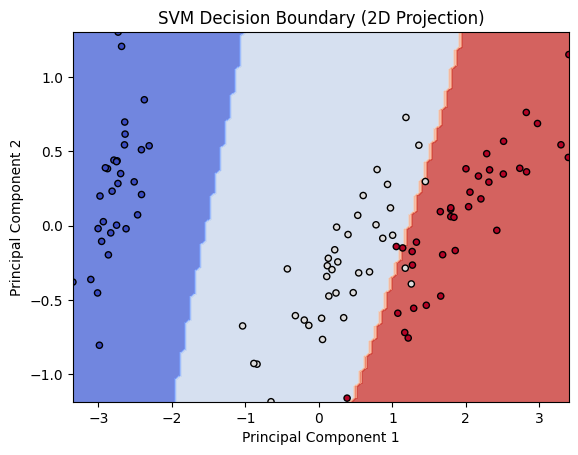

In [104]:
 #Plot decision boundary
xx, yy = np.meshgrid(np.linspace(X_train_2d[:, 0].min(), X_train_2d[:, 0].max(), 100),
                     np.linspace(X_train_2d[:, 1].min(), X_train_2d[:, 1].max(), 100))
Z = svm_model.predict(np.c_[xx.ravel(), yy.ravel()])
Z = Z.reshape(xx.shape)

plt.contourf(xx, yy, Z, alpha=0.8, cmap=plt.cm.coolwarm)
plt.scatter(X_train_2d[:, 0], X_train_2d[:, 1], c=y_train, s=20, edgecolor='k', cmap=plt.cm.coolwarm)
plt.title("SVM Decision Boundary (2D Projection)")
plt.xlabel("Principal Component 1")
plt.ylabel("Principal Component 2")
plt.show()

In [105]:
# Practical Implications of SVM for Mushroom Classification

# Based on the provided code and analysis, here's a discussion of the practical implications of using SVM for mushroom classification:

# Strengths of SVM:

# 1. High Dimensionality Handling: The mushroom dataset has numerous categorical features, resulting in a high-dimensional feature space after one-hot encoding. SVMs excel in high-dimensional spaces, making them a suitable choice.  The kernel trick allows SVMs to efficiently find optimal hyperplanes in these spaces.

# 2. Non-linear Relationships:  The analysis (e.g., pairplots, kernel comparisons) can reveal whether the data is linearly separable or not. If non-linear relationships exist between features and the class label, kernels like 'rbf' or 'poly' allow SVMs to effectively model these complexities.

# 3. Robustness to Outliers: SVMs focus on support vectors (data points closest to the decision boundary), making them relatively insensitive to outliers.

# Weaknesses and Considerations:

# 1. Computational Cost: Training SVMs can be computationally expensive, especially with large datasets and complex kernels.  The mushroom dataset is relatively moderate in size, so computational cost is unlikely to be a major issue.  However, scaling up to massive datasets could pose challenges.

# 2. Hyperparameter Tuning:  SVM performance is heavily dependent on the selection of the appropriate kernel and its hyperparameters (C and gamma).  GridSearchCV or other optimization techniques are essential for determining optimal values. If hyperparameters are not tuned correctly, the model may underperform or overfit.


# 3. Interpretability:  While SVM can provide accurate classifications, it's often less interpretable than some other models.  Understanding *why* a specific mushroom is classified a certain way is not readily apparent from the model itself.  Feature importance analysis (not fully performed in the provided code) could offer some insights.

# 4. Imbalanced Datasets:  The code checks for class proportions, but further analysis of class imbalance and its impact on performance should be performed.  If there's a severe imbalance, techniques like class weighting might be necessary to improve the model's accuracy on the minority class.

# Practical Recommendations:

# 1. Optimize hyperparameters using techniques like GridSearchCV or RandomizedSearchCV with appropriate cross-validation strategies.

# 2. Consider feature selection or dimensionality reduction techniques to improve the model's performance, speed up training, and potentially enhance its interpretability, especially if one-hot encoding produces many features.

# 3. Evaluate the model's robustness using techniques like cross-validation and out-of-sample testing.

# 4. If class imbalance is a problem, experiment with techniques such as SMOTE (Synthetic Minority Over-sampling Technique) or adjusted class weights during training.

# 5. Use feature importance analysis to help understand the key features that the SVM is using for classification and assess whether these make sense from a domain perspective.  This can help build more confidence in the model's predictions.


# In conclusion, SVM is a viable method for mushroom classification, but careful consideration of hyperparameter tuning and class imbalance is essential. Given its strengths with high-dimensional data and non-linear relationships, it's a good candidate. However, its relative lack of interpretability should be factored into the decision-making process.